In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.core.pylabtools import figsize

from ipywidgets import widgets
from IPython.display import display

import numpy as np
import torch

In [2]:
import numpy as np
from sklearn import datasets

data = datasets.fetch_olivetti_faces()
images = data['images']

# make mask
X, Y = np.meshgrid( np.arange(64) -31.5, np.arange(64) -31.5)

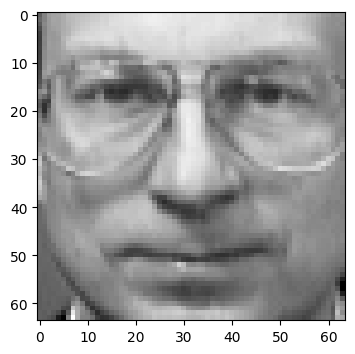

In [38]:
figsize(4,4)
plt.imshow(images[120], cmap='gray')

In [5]:
from skimage.transform import rotate

### What fraction of the image can we take?

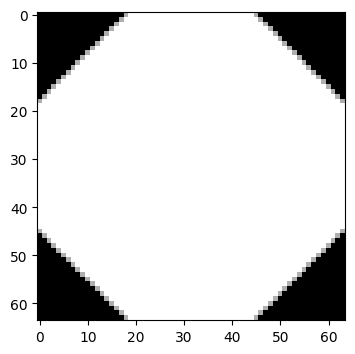

In [49]:
plt.imshow(rotate(np.ones((64,64)), 45), cmap='gray')

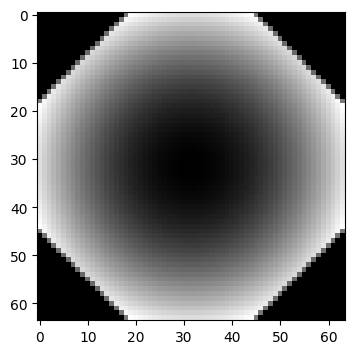

In [68]:
itest = rotate(np.ones((64,64)), 45)

plt.imshow((X * itest)**2 + (Y * itest)**2, cmap='gray')

We want to find the minimum radius such that nothing within that radius is black

In [90]:
itest[X**2 + Y**2 < 31.5**2].min()

1.0

In [100]:
angles = np.linspace(0, 365, 10000)
mins = []

r2 = 31.5**2
for angle in angles:
    iout = rotate(np.ones((64,64)), angle)
    mins.append(iout[X**2 + Y**2 < r2].min())

np.min(mins)

1.0

Excellent: taking this radius squared as a restriction should ensure that there is no orientation information in the cropping.

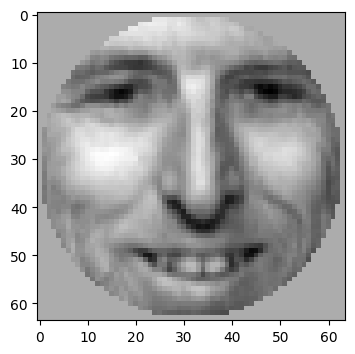

In [121]:
im = images[380].copy()
im[X**2 + Y**2 >= 31.5**2] = 0.5

plt.imshow(im, cmap='gray')

In [146]:
figsize(100, 400)
fig, axes = plt.subplots(20,5)

start = 0
for i in range(100):
    plt.subplot(20,5,i+1)
    im = images[start+i].copy()
    im[X**2 + Y**2 >= 31.5**2] = 0.5
    plt.imshow(im, cmap='gray')

In [147]:
figsize(100, 400)
fig, axes = plt.subplots(20,5)

start = 100
for i in range(100):
    plt.subplot(20,5,i+1)
    im = images[start+i].copy()
    im[X**2 + Y**2 >= 31.5**2] = 0.5
    plt.imshow(im, cmap='gray')

In [148]:
figsize(100, 400)
fig, axes = plt.subplots(20,5)

start = 200
for i in range(100):
    plt.subplot(20,5,i+1)
    im = images[start+i].copy()
    im[X**2 + Y**2 >= 31.5**2] = 0.5
    plt.imshow(im, cmap='gray')

In [149]:
figsize(100, 400)
fig, axes = plt.subplots(20,5)

start = 300
for i in range(100):
    plt.subplot(20,5,i+1)
    im = images[start+i].copy()
    im[X**2 + Y**2 >= 31.5**2] = 0.5
    plt.imshow(im, cmap='gray')

In [160]:
images_cp = images.copy()

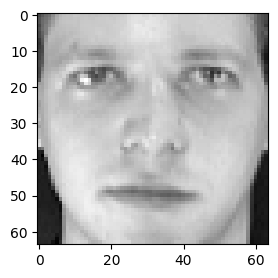

In [161]:
figsize(3,3)
plt.imshow(images_cp[0], cmap='gray')

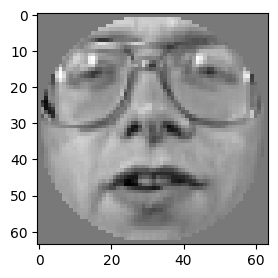

In [164]:
for image in images_cp:
    image[X**2 + Y**2 > 31.5**2] = 0.5
plt.imshow(images_cp[10], cmap='gray')

## Coding time:

In [243]:
%run rotated_olivetti.py

<Figure size 300x300 with 0 Axes>

In [248]:
ds = FaceDataset(10*[-3.], 'train')

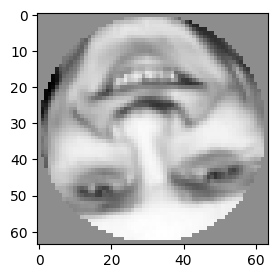

In [249]:
plt.imshow(ds[0:10]['image'][5], cmap='gray')

In [268]:
%run ../../basicModel.py

In [269]:
model = EstimateAngle_Faces()

In [270]:
model.setup()

In [271]:
%run ../../trainers.py

In [273]:
runEarlyStoppingTraining(model, './test')

wandb: Currently logged in as: lrast. Use `wandb login --relogin` to force relogin


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/Users/luke/Library/Python/3.9/lib/python/site-packages/pytorch_lightning/loggers/wandb.py:391: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

  | Name   | Type             | Params
--------------------------------------------
0 | model  | Sequential       | 263 K 
1 | cosSim | CosineSimilarity | 0     
--------------------------------------------
263 K     Trainable params
0         Non-trainable params
263 K     Total params
1.054     Total estimated model params size (MB)


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Traceback (most recent call last):
Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "<string>", line 1, in <module>
  File "/opt/homebrew/Cellar/python@3.9/3.9.17_1/Frameworks/Python.framework/Versions/3.9/lib/python3.9/multiprocessing/spawn.py", line 116, in spawn_main
  File "/opt/homebrew/Cellar/python@3.9/3.9.17_1/Frameworks/Python.framework/Versions/3.9/lib/python3.9/multiprocessing/spawn.py", line 116, in spawn_main
    exitcode = _main(fd, parent_sentinel)
  File "/opt/homebrew/Cellar/python@3.9/3.9.17_1/Frameworks/Python.framework/Versions/3.9/lib/python3.9/multiprocessing/spawn.py", line 126, in _main
    exitcode = _main(fd, parent_sentinel)
  File "/opt/homebrew/Cellar/python@3.9/3.9.17_1/Frameworks/Python.framework/Versions/3.9/lib/python3.9/multiprocessing/spawn.py", line 126, in _main
    self = reduction.pickle.load(from_parent)
ModuleNotFoundError: No module named 'datageneration'
    self = reduction.pickle.load(from_parent)
ModuleNotFou

RuntimeError: DataLoader worker (pid(s) 64602, 64603) exited unexpectedly